##Introduction
###In this notebook, we will be working on the Dry Bean Dataset from Kaggle, which involves the classification of different types of dry beans. The dataset contains various physical properties of the beans, and our goal is to build a model that can accurately classify the type of bean based on these properties.

##Dataset Overview
###The Dry Bean Dataset consists of 13,611 instances and 17 features, including:

* Area
* Perimeter
* Major Axis Length
* Minor Axis Length
* Aspect Ratio
* Eccentricity
* Convex Area
* Equivalent Diameter
* Extent
* Solidity
* Roundness
* Compactness
* Shape Factor 1
* Shape Factor 2
* Shape Factor 3
* Shape Factor 4
* Class (the type of bean, which is the target variable)

###The dataset contains the following bean types:

* Seker
* Barbunya
* Bombay
* Cali
* Dermason
* Horoz
* Sira

##Objective
###Our primary objective is to develop a logistic regression model to classify the type of bean based on its physical properties. Logistic regression is a popular and straightforward method for classification problems, particularly when the target variable is categorical.

##Steps Involved
###1) Data Exploration and Preprocessing: We'll start by loading the dataset, exploring its structure, and performing necessary preprocessing steps such as handling missing values, normalizing features, and encoding categorical variables.

###2) Model Building: Next, we'll build a logistic regression model using the preprocessed data.

###3) Model Evaluation: We'll evaluate the performance of our model using appropriate metrics such as accuracy, precision, recall, and the F1 score.

###4) Model Optimization: Finally, we'll explore ways to optimize our model, potentially using techniques like hyperparameter tuning and cross-validation.

###By the end of this notebook, we aim to have a robust logistic regression model capable of accurately classifying the different types of dry beans in the dataset.

#Importing Necessary Libraries
###We are required to importing the libraries so as to performing EDA. These include NumPy, Pandas, Matplotlib, and Seaborn.

In [ ]:
import pandas as pd # Pandas is a powerful library for data manipulation and analysis.
import numpy as np # NumPy is a powerful tool for numerical computations in Python.
import seaborn as sns # Seaborn is a statistical data visualization library based on Matplotlib
import matplotlib.pyplot as plt # Matplotlib is a comprehensive library for creating static, animated, and interactive visualizations in Python
%matplotlib inline

##Loading the Dataset

In [ ]:
df= pd.read_csv("Dry_Bean_Dataset.csv") #The df = pd.read_csv line reads a CSV file into a DataFrame named df using the pandas library.

##EDA
Exploratory Data Analysis (EDA) is essential for several reasons:

1) Understanding Data Structure: EDA helps you comprehend the data's underlying structure, including the types of features, data types, and relationships between variables.

2) Identifying Patterns and Trends: Visualizations and summary statistics reveal patterns, trends, and anomalies, which can provide insights into the data.

3) Detecting Missing Values and Outliers: EDA allows you to identify missing values, outliers, and errors, which are crucial for data cleaning and ensuring data quality.

4) Feature Selection: By understanding the relationships between features and the target variable, EDA aids in selecting the most relevant features for modeling.

5) Guiding Further Analysis: Insights from EDA can guide the selection of appropriate modeling techniques and preprocessing steps, leading to more effective and accurate models.

In summary, EDA is a critical step in the data science process that ensures a deep understanding of the data, leading to better-informed decisions and more robust models.

In [ ]:
df.head() #We will now read the data from a CSV file into a Pandas DataFrame Let us have a look at how our dataset looks like using df.head()

,Area,Perimeter,MajorAxisLength,MinorAxisLength,AspectRation,Eccentricity,ConvexArea,EquivDiameter,Extent,Solidity,roundness,Compactness,ShapeFactor1,ShapeFactor2,ShapeFactor3,ShapeFactor4,Class
0,28395,610.291,208.178117,173.888747,1.197191,0.549812,28715,190.141097,0.763923,0.988856,0.958027,0.913358,0.007332,0.003147,0.834222,0.998724,SEKER
1,28734,638.018,200.524796,182.734419,1.097356,0.411785,29172,191.272751,0.783968,0.984986,0.887034,0.953861,0.006979,0.003564,0.909851,0.998430,SEKER
2,29380,624.110,212.826130,175.931143,1.209713,0.562727,29690,193.410904,0.778113,0.989559,0.947849,0.908774,0.007244,0.003048,0.825871,0.999066,SEKER
3,30008,645.884,210.557999,182.516516,1.153638,0.498616,30724,195.467062,0.782681,0.976696,0.903936,0.928329,0.007017,0.003215,0.861794,0.994199,SEKER
4,30140,620.134,201.847882,190.279279,1.060798,0.333680,30417,195.896503,0.773098,0.990893,0.984877,0.970516,0.006697,0.003665,0.941900,0.999166,SEKER


In [ ]:
df.columns #Displays the names of the columns

Index(['Area', 'Perimeter', 'MajorAxisLength', 'MinorAxisLength',
       'AspectRation', 'Eccentricity', 'ConvexArea', 'EquivDiameter', 'Extent',
       'Solidity', 'roundness', 'Compactness', 'ShapeFactor1', 'ShapeFactor2',
       'ShapeFactor3', 'ShapeFactor4', 'Class'],
      dtype='object')

In [ ]:
df.shape # Displays the total count of the Rows and Columns respectively.

(13611, 17)

In [ ]:
df.Class.unique()

array(['SEKER', 'BARBUNYA', 'BOMBAY', 'CALI', 'HOROZ', 'SIRA', 'DERMASON'],
      dtype=object)

In [ ]:
df['Class'].value_counts() #This code returns the number of occurrences of each unique value in the 'Class' column of the dataframe df.

Class
DERMASON    3546
SIRA        2636
SEKER       2027
HOROZ       1928
CALI        1630
BARBUNYA    1322
BOMBAY       522
Name: count, dtype: int64

In [ ]:
df.isnull().sum() #Displays the total count of the null values in the particular columns.

Area               0
Perimeter          0
MajorAxisLength    0
MinorAxisLength    0
AspectRation       0
Eccentricity       0
ConvexArea         0
EquivDiameter      0
Extent             0
Solidity           0
roundness          0
Compactness        0
ShapeFactor1       0
ShapeFactor2       0
ShapeFactor3       0
ShapeFactor4       0
Class              0
dtype: int64

In [ ]:
df.info() #Displays the total count of values present in the particular column along with the null count and data type.

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 13611 entries, 0 to 13610
Data columns (total 17 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   Area             13611 non-null  int64  
 1   Perimeter        13611 non-null  float64
 2   MajorAxisLength  13611 non-null  float64
 3   MinorAxisLength  13611 non-null  float64
 4   AspectRation     13611 non-null  float64
 5   Eccentricity     13611 non-null  float64
 6   ConvexArea       13611 non-null  int64  
 7   EquivDiameter    13611 non-null  float64
 8   Extent           13611 non-null  float64
 9   Solidity         13611 non-null  float64
 10  roundness        13611 non-null  float64
 11  Compactness      13611 non-null  float64
 12  ShapeFactor1     13611 non-null  float64
 13  ShapeFactor2     13611 non-null  float64
 14  ShapeFactor3     13611 non-null  float64
 15  ShapeFactor4     13611 non-null  float64
 16  Class            13611 non-null  object 
dtypes: float64(1

In [ ]:
df[df.duplicated()] #This code returns the count of duplicate rows in the DataFrame df.


,Area,Perimeter,MajorAxisLength,MinorAxisLength,AspectRation,Eccentricity,ConvexArea,EquivDiameter,Extent,Solidity,roundness,Compactness,ShapeFactor1,ShapeFactor2,ShapeFactor3,ShapeFactor4,Class
5505,33518,702.956,277.571399,154.305581,1.798842,0.831240,34023,206.582775,0.808383,0.985157,0.852377,0.744251,0.008281,0.001567,0.553909,0.996396,HOROZ
5509,33954,716.750,277.368480,156.356326,1.773951,0.825970,34420,207.922042,0.799482,0.986461,0.830549,0.749624,0.008169,0.001591,0.561936,0.996847,HOROZ
5548,38427,756.323,306.533886,160.591784,1.908777,0.851782,38773,221.193978,0.796976,0.991076,0.844174,0.721597,0.007977,0.001334,0.520702,0.993905,HOROZ
5554,38891,791.343,319.499996,156.869619,2.036723,0.871168,39651,222.525412,0.650025,0.980833,0.780422,0.696480,0.008215,0.001192,0.485085,0.987983,HOROZ
5599,40804,790.802,323.475648,163.287717,1.981016,0.863241,41636,227.932592,0.787570,0.980017,0.819931,0.704636,0.007928,0.001206,0.496512,0.983598,HOROZ
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7263,63408,1005.966,412.551649,196.337705,2.101235,0.879494,64200,284.136540,0.798791,0.987664,0.787385,0.688730,0.006506,0.000903,0.474348,0.996718,HOROZ
7278,63882,1004.206,411.263403,198.765453,2.069089,0.875452,64663,285.196579,0.754705,0.987922,0.796054,0.693465,0.006438,0.000918,0.480893,0.995010,HOROZ
7285,63948,996.497,412.297178,198.877557,2.073121,0.875971,64641,285.343867,0.777909,0.989279,0.809254,0.692083,0.006447,0.000912,0.478979,0.992981,HOROZ
7340,65766,1035.842,406.416622,207.242369,1.961069,0.860218,66698,289.371512,0.792295,0.986027,0.770237,0.712007,0.006180,0.000980,0.506954,0.994172,HOROZ


In [ ]:
df_no_duplicates = df.drop_duplicates() #By dropping duplicate values, we maintain the quality and integrity of your dataset, which is fundamental for accurate data analysis and modeling.

In [ ]:
df_no_duplicates.shape #Checking the shape after dropping the values.

(13543, 17)

In [ ]:
df.describe()

,Area,Perimeter,MajorAxisLength,MinorAxisLength,AspectRation,Eccentricity,ConvexArea,EquivDiameter,Extent,Solidity,roundness,Compactness,ShapeFactor1,ShapeFactor2,ShapeFactor3,ShapeFactor4
count,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000
mean,53048.284549,855.283459,320.141867,202.270714,1.583242,0.750895,53768.200206,253.064220,0.749733,0.987143,0.873282,0.799864,0.006564,0.001716,0.643590,0.995063
std,29324.095717,214.289696,85.694186,44.970091,0.246678,0.092002,29774.915817,59.177120,0.049086,0.004660,0.059520,0.061713,0.001128,0.000596,0.098996,0.004366
min,20420.000000,524.736000,183.601165,122.512653,1.024868,0.218951,20684.000000,161.243764,0.555315,0.919246,0.489618,0.640577,0.002778,0.000564,0.410339,0.947687
25%,36328.000000,703.523500,253.303633,175.848170,1.432307,0.715928,36714.500000,215.068003,0.718634,0.985670,0.832096,0.762469,0.005900,0.001154,0.581359,0.993703
50%,44652.000000,794.941000,296.883367,192.431733,1.551124,0.764441,45178.000000,238.438026,0.759859,0.988283,0.883157,0.801277,0.006645,0.001694,0.642044,0.996386
75%,61332.000000,977.213000,376.495012,217.031741,1.707109,0.810466,62294.000000,279.446467,0.786851,0.990013,0.916869,0.834270,0.007271,0.002170,0.696006,0.997883
max,254616.000000,1985.370000,738.860154,460.198497,2.430306,0.911423,263261.000000,569.374358,0.866195,0.994677,0.990685,0.987303,0.010451,0.003665,0.974767,0.999733


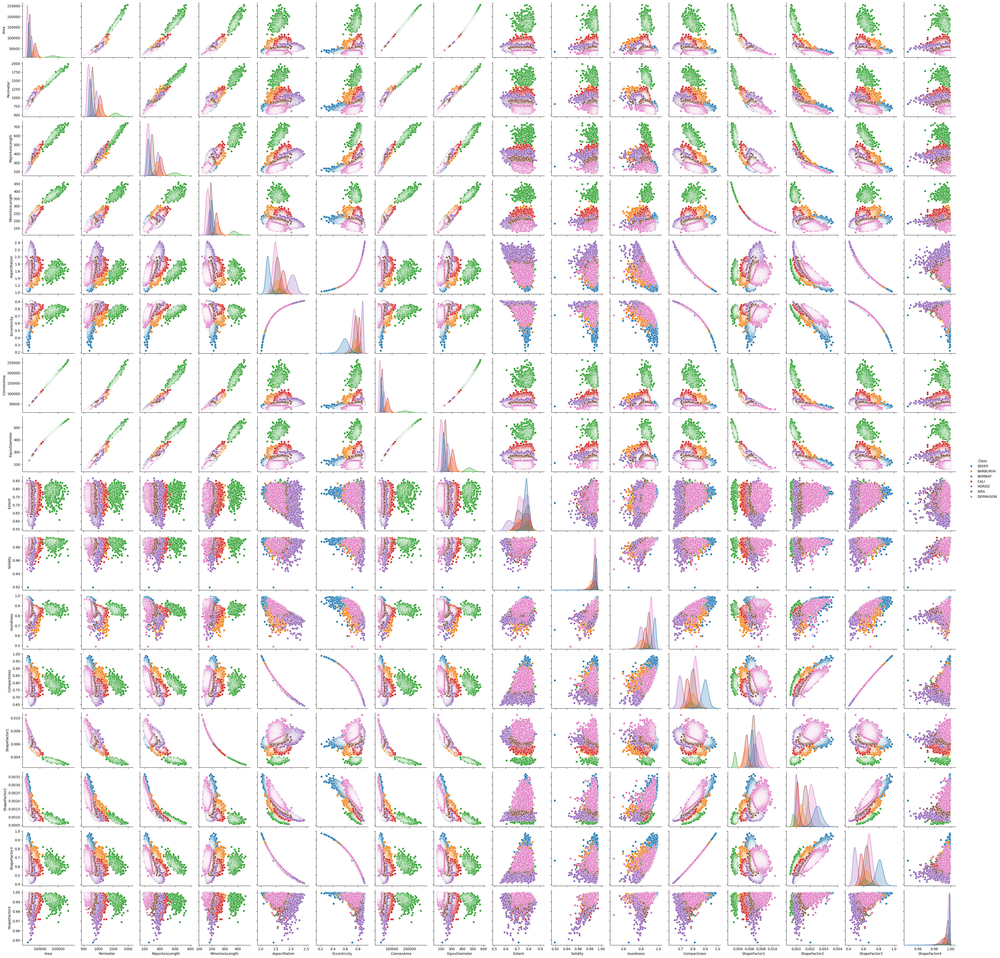

In [ ]:
sns.pairplot(df, hue='Class')
plt.show()

In [ ]:
from sklearn.model_selection import train_test_split #Imports a function to split datasets into training and testing sets.
from sklearn.preprocessing import StandardScaler #Imports a class to standardize features by removing the mean and scaling to unit variance.
from sklearn.preprocessing import LabelEncoder #Imports a class to encode target labels with value between 0 and n_classes 1.

In [ ]:
# Encode the labels
label_encoder = LabelEncoder() #Creates an instance of the LabelEncoder class
df['Class'] = label_encoder.fit_transform(df['Class']) #This line encodes the categorical values in the 'Class' column of the DataFrame df into numeric labels. The fit_transform method:

In [ ]:
# Separate features and target
X = df.drop('Class', axis=1) #This line creates a new DataFrame X by dropping the 'Class' column from the original DataFrame df
y = df['Class'] #This line assigns the 'Class' column of the original DataFrame df to the variable y. This column represents the target variable or labels that we want to predict.

In [ ]:
# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
#this line of code splits the dataset into training and testing sets, with 80% of the data used for training the model and 20% for testing it, ensuring the split is reproducible.

In [ ]:
# Scale the features
scaler = StandardScaler() #This line creates an instance of the StandardScaler class. The StandardScaler standardizes features by removing the mean and scaling to unit variance.
X_train = scaler.fit_transform(X_train)
#This method first fits the scaler to the X_train data by calculating the mean and standard deviation of each feature in the training set. It then transforms the training data by subtracting the mean and scaling to unit variance for each feature.

X_test = scaler.transform(X_test)
#This method transforms the X_test data using the mean and standard deviation calculated from the training set (X_train). It ensures that the test data is scaled in the same way as the training data.


In [ ]:
from sklearn.linear_model import LogisticRegression #Imports the LogisticRegression class for creating and training logistic regression models.
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report #Imports functions to evaluate model performance, including accuracy score, confusion matrix, and classification report (precision, recall, F1-score).

In [ ]:
# Initialize the model
logistic_model = LogisticRegression(max_iter=1000)

####LogisticRegression: Creates an instance of the LogisticRegression class, which is used for performing logistic regression, a type of linear model for binary classification.
####max_iter=1000: Sets the maximum number of iterations for the optimization algorithm to converge. This is used to ensure that the solver has sufficient iterations to find the optimal parameters. If the default maximum iterations (usually 100) are not enough for the model to converge, increasing this number can help.
####In summary, this line of code initializes a logistic regression model with a specified maximum number of iterations set to 1000.

In [ ]:
# Train the model
logistic_model.fit(X_train, y_train)


LogisticRegression(max_iter=1000)

####logistic_model: The instance of the LogisticRegression class created earlier.
####fit(X_train, y_train): This method trains the logistic regression model using the training data.
####X_train: The training set features.
####y_train: The training set labels.
####During this process, the model learns the relationship between the features and the target variable by finding the optimal parameters (coefficients) that best fit the training data.

####In summary, this line of code trains the logistic regression model using the provided training data (X_train and y_train).

In [ ]:
# Make predictions
y_pred = logistic_model.predict(X_test)

####logistic_model: The trained logistic regression model.
####predict(X_test): This method uses the trained model to make predictions on the test set features.
#####X_test: The testing set features.

#####The result is:

#####y_pred: The predicted labels for the test set, based on the learned relationship from the training data.
####In summary, this line of code uses the trained logistic regression model to predict the target labels for the test data and stores these predicted labels in the variable y_pred.

In [ ]:
# Accuracy
accuracy = accuracy_score(y_test, y_pred)
print(f'Accuracy: {accuracy * 100:.2f}%')
#these lines of code calculate the accuracy of the model's predictions and print it as a percentage.

Accuracy: 92.66%


##The logistic regression model achieved an accuracy of 92.66% on the test set.

In [ ]:
# Confusion Matrix
conf_matrix = confusion_matrix(y_test, y_pred)
print('Confusion Matrix:')
print(conf_matrix)


Confusion Matrix:
[[238   0  14   0   0   0   9]
 [  0 117   0   0   0   0   0]
 [ 11   0 298   0   4   1   3]
 [  0   0   0 606   1   8  56]
 [  2   0   2   4 392   0   8]
 [  8   0   0   6   0 388  11]
 [  0   0   0  40   7   5 484]]


In [ ]:
# Classification Report
class_report = classification_report(y_test, y_pred)
print('Classification Report:')
print(class_report)

Classification Report:
              precision    recall  f1-score   support

           0       0.92      0.91      0.92       261
           1       1.00      1.00      1.00       117
           2       0.95      0.94      0.94       317
           3       0.92      0.90      0.91       671
           4       0.97      0.96      0.97       408
           5       0.97      0.94      0.95       413
           6       0.85      0.90      0.87       536

    accuracy                           0.93      2723
   macro avg       0.94      0.94      0.94      2723
weighted avg       0.93      0.93      0.93      2723



In [ ]:
from sklearn.model_selection import GridSearchCV


In [ ]:
# Define the parameter grid
param_grid = {
    'C': [0.1, 1, 10, 100],
    'solver': ['lbfgs', 'liblinear']
    }

In [ ]:
# Initialize the GridSearchCV
grid_search = GridSearchCV(LogisticRegression(max_iter=1000), param_grid, cv=5, scoring='accuracy')


In [ ]:
# Fit the model
grid_search.fit(X_train, y_train)


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _c

GridSearchCV(cv=5, estimator=LogisticRegression(max_iter=1000),
             param_grid={'C': [0.1, 1, 10, 100],
                         'solver': ['lbfgs', 'liblinear']},
             scoring='accuracy')

In [ ]:
# Best parameters and best score
print(f'Best Parameters: {grid_search.best_params_}')
print(f'Best Score: {grid_search.best_score_}')


Best Parameters: {'C': 100, 'solver': 'lbfgs'}
Best Score: 0.9246878101598945


In [ ]:
# Evaluate on test set
best_model = grid_search.best_estimator_
y_pred_best = best_model.predict(X_test)
accuracy_best = accuracy_score(y_test, y_pred_best)
print(f'Accuracy with Best Parameters: {accuracy_best * 100:.2f}%')

Accuracy with Best Parameters: 92.62%
